# Foundations Of AIML
## Session 11
### Experiment 2.1: Siamese networks

In [1]:
# Importing pytorch packages
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn
import torchvision
import torchvision.transforms as transforms
from torch.autograd import Variable
# Importing config.py file
import config as cf
from utils import *
from light_cnn import network_9layers
from resnet import resnet18
from siamese_data_loader import *
from contrastive import *   ### implementation of contrastive loss
## Importing python packages
import os
import sys
import time
import datetime
import numpy as np
import math
import matplotlib.pyplot as plt

In [2]:
img_root = cf.data_dir+'IMFDB_final/'

train_list_file = cf.data_dir+'IMFDB_train_sorted.txt'   #### 5000 images for training
val_list_file = cf.data_dir+'IMFDB_test_sorted.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print len(train_image_list), len(val_image_list)

### Notice a new data loader for siamese networks. This gives the image pairs (image_1, image_2) and a label as input to the siamese networks.
### see siamese_data_loader.py for details

trainloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
                                           batch_size=32, num_workers=1, shuffle = False, pin_memory=True)

testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=10, num_workers=1, shuffle = False, pin_memory=True)


classes = ['AamairKhan', 'Rimisen', 'Kajol', 'KareenaKapoor','RishiKapoor', 'AmrishPuri', 'AnilKapoor', 'AnupamKher', 'BomanIrani', 'HrithikRoshan', 'KajalAgarwal', 'KatrinaKaif', 'Madhavan', 'MadhuriDixit', 'Umashri', 'Trisha']

5000 1095


In [3]:
# Checking for GPU instance
use_cuda = torch.cuda.is_available()
#Intilizaing the loss value as high value
best_loss = 99999999

num_classes = 16

In [4]:
feature_net = network_9layers()   ### creates an object of this network architecture
from collections import OrderedDict
new_state_dict = OrderedDict()
state_dict = torch.load(cf.data_dir+'light_cnn/LightCNN_9Layers_checkpoint.pth.tar')['state_dict']    ### load the learned lightCNN weights
for k, v in state_dict.items():
    name = k[7:] 
    new_state_dict[name] = v

feature_net.load_state_dict(new_state_dict)


layers_to_remove = ['fc2']
for layers_ in layers_to_remove:        
    del(feature_net._modules[layers_])
    
classifier = nn.Sequential(nn.Linear(256, 64), nn.BatchNorm1d(64), nn.ReLU(),
                           nn.Linear(64, 32), nn.BatchNorm1d(32), nn.ReLU(),
                           nn.Linear(32, num_classes))

feature_net.fc2 = nn.Sequential(nn.Linear(256, 5))
if use_cuda:
    feature_net.cuda()
    classifier.cuda()
    


In [5]:
### Intiliazing the loss
criterion = nn.CrossEntropyLoss()
siamese_loss = contrastive_loss()   ### Notice a new loss. contrastive.py shows how to compute contrastive loss.

#### Lets train the siamese networks. The objective is images from same class (+ pair, label = 0) should have similar feature and images from different classes (- pair, label = 1) should have different features. Instead of having two physical networks sharing the weights, in implementation we have only one network and first pass image_1 (to get its feature) and then pass image_2 (to get its feature) through the same network. We then compute the contrastive loss on these feature pairs from input image pairs. This saves a lot of memory.

In [6]:
def train(epoch):
    print('\nEpoch: %d' % epoch)
    feature_net.train()
    train_loss = 0
    correct = 0
    total = 1
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(trainloader):
        
#         if targets.sum() >= 0.6*inputs_1.size()[0]:    ### ignore mini-batches with more than 90% negative samples.
#             continue
#         print targets.sum()/inputs_1.size()[0]
        if use_cuda:
            inputs_1, inputs_2, targets = inputs_1.cuda(), inputs_2.cuda(), targets.cuda()
        optimizer.zero_grad()
        inputs_1, inputs_2, targets = Variable(inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net.get_features2(inputs_1)      ### get feature for image_1
        features_2 = feature_net.get_features2(inputs_2)      ### get feature for image_2
        
        loss = siamese_loss(features_1, features_2, targets.float())   ### compute the contrastive loss, computes the similarity between the features.
        loss.backward()
        optimizer.step()

        train_loss += loss.data[0]
        
        if batch_idx%10 == 0 or batch_idx == len(trainloader)-1:
            progress_bar(batch_idx, len(trainloader), 'Loss: %.3f '
                         % (train_loss/(batch_idx+1)))
        
    train_loss_file.write('%d %.3f %.3f\n' %(epoch, train_loss/len(trainloader), 100.*correct/total))



In [7]:
def test(epoch):
    global best_loss
    feature_net.eval()
    test_loss = 0
    correct = 0
    total = 1
    for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
        if use_cuda:
            inputs_1, inputs_2, targets = inputs_1.cuda(), inputs_2.cuda(), targets.cuda()
        optimizer.zero_grad()
        inputs_1, inputs_2, targets = Variable(inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net.get_features2(inputs_1)      
        features_2 = feature_net.get_features2(inputs_2)      
        
        loss = siamese_loss(features_1, features_2, targets.float())
        test_loss += loss.data[0]
        
        if batch_idx%10 == 0 or batch_idx == len(testloader)-1:
            progress_bar(batch_idx, len(testloader), 'Loss: %.3f '
                         % (test_loss/(batch_idx+1)))
        
    print 'val_loss: ',  test_loss/len(testloader)
    val_loss_file.write('%d %.3f %.3f\n' %(epoch,  test_loss/len(testloader), 100.*correct/total))

    # Save checkpoint.
    losss = test_loss/len(testloader)
    if  losss < best_loss:   ### save model with the best loss so far
        print('Saving..') 
        state = {
            'net': feature_net
        }
        if not os.path.isdir(cf.data_dir+'checkpoint'):
            os.mkdir(cf.data_dir+'checkpoint')
        torch.save(state, cf.data_dir+'checkpoint/siamese_ckpt.t7')
        best_loss = losss
    
    return test_loss/len(testloader)

In [8]:
experiment = 'siamese_IMFDB'
train_loss_file = open(cf.data_dir+experiment+"train_loss.txt", "w", 0)
val_loss_file = open(cf.data_dir+experiment+"val_loss.txt", "w", 0)

In [9]:
optimizer = optim.Adam(feature_net.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   #### dynamic LR scheduler
for epoch in range(0, 100):
    train(epoch)
    test_loss = test(epoch)
    scheduler.step(test_loss)
    
train_loss_file.close()
val_loss_file.close()


Epoch: 0
 [==================================>] | Loss: 1765.827                         157/157 
 [==================================>] | Loss: 23.137                           110/110 
val_loss:  23.1367410576
Saving..

Epoch: 1
 [==================================>] | Loss: 69.278                           157/157 
 [==================================>] | Loss: 9.572                            110/110 
val_loss:  9.5716147241
Saving..

Epoch: 2
 [==================================>] | Loss: 21.363                           157/157 
 [==================================>] | Loss: 3.673                            110/110 
val_loss:  3.67311500744
Saving..

Epoch: 3
 [==================================>] | Loss: 2.824                            157/157 
 [==================================>] | Loss: 3.851                            110/110 
val_loss:  3.85063595989

Epoch: 4
 [==================================>] | Loss: 2.241                            157/157 
 [=====================

Process Process-115:
  File "/users/suriya/.local/lib/python2.7/site-packages/torch/multiprocessing/queue.py", line 21, in recv
Traceback (most recent call last):
  File "/usr/lib/python2.7/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python2.7/multiprocessing/process.py", line 114, in run
    self._target(*self._args, **self._kwargs)
  File "/users/suriya/.local/lib/python2.7/site-packages/torch/utils/data/dataloader.py", line 36, in _worker_loop
    r = index_queue.get()
  File "/usr/lib/python2.7/multiprocessing/queues.py", line 378, in get
    return recv()
    buf = self.recv_bytes()
KeyboardInterrupt


KeyboardInterrupt: 

In [10]:
### After training we load the model that performed the best on validation data (avoid picking overfitted model)
### we will use the base pre-trained network for feature extraction only. This feature is used to train an MLP classifier.

feature_net = torch.load(cf.data_dir+'checkpoint/siamese_ckpt.t7')['net'].eval()

##### Lets see how well does the siamese detect an imposter. We check whether image_2 is same individual as image_1 or an imposter. We do this by computing dissimilarity score between features.

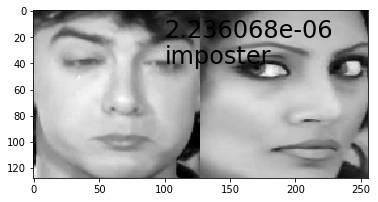

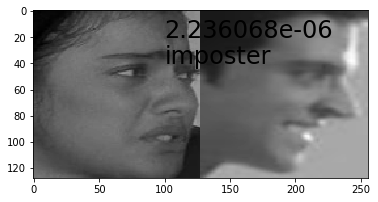

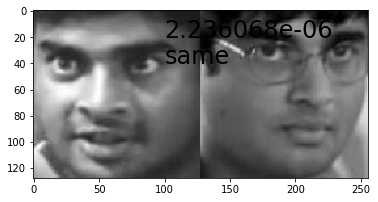

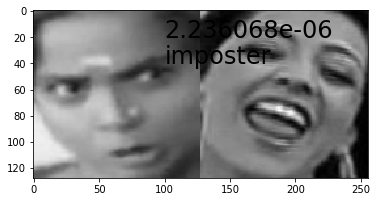

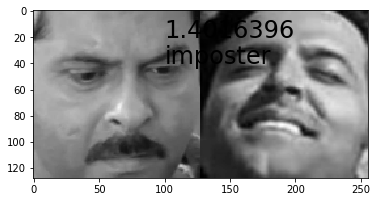

...

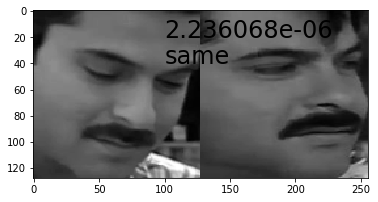

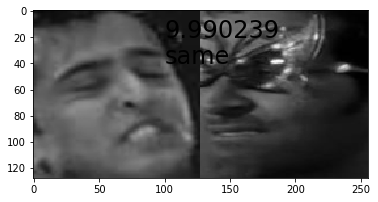

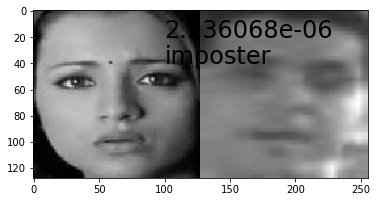

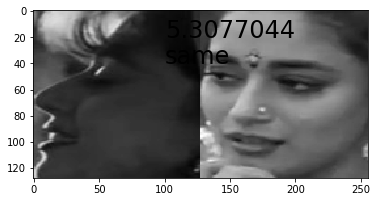

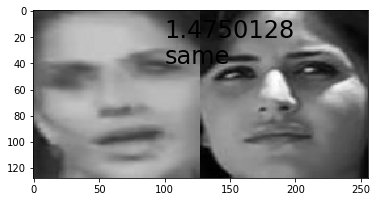

In [11]:
testloader = torch.utils.data.DataLoader(siamese_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=1, num_workers=1, shuffle = False, pin_memory=True)

lab = ['same', 'imposter']
for batch_idx, (inputs_1, inputs_2, targets) in enumerate(testloader):
    if batch_idx%10 == 0 or int(targets)==0:      ### show every tenth image or if its the same individual
        
        if use_cuda:
            inputs_1, inputs_2, targets = inputs_1.cuda(), inputs_2.cuda(), targets.cuda()
        
        inputs_1, inputs_2, targets = Variable(inputs_1), Variable(inputs_2), Variable(targets)
        features_1 = feature_net.get_features2(inputs_1)      
        features_2 = feature_net.get_features2(inputs_2)      
        
        dissimilarity = F.pairwise_distance(features_1, features_2).data[0].cpu().numpy()[0]
    
        img = np.concatenate((inputs_1.data.cpu().numpy()[0][0], inputs_2.data.cpu().numpy()[0][0]), axis = 1)
        plt.imshow(img, cmap='gray')
        plt.text(100,20,str(dissimilarity), fontsize=24)     ### similarity score
        plt.text(100,40,lab[int(targets.data[0])], fontsize=24)   ### ground truth
        plt.show()
    

### Now we use this network for feature extraction and train an MLP classifier. Feature_net is not updated/train/tweak after this. We only train the MLP classifier.

In [12]:
from data_loader import custom_data_loader

train_list_file = cf.data_dir+'IMFDB_train.txt'   #### 5000 images for training
val_list_file = cf.data_dir+'IMFDB_test.txt'      #### 1095 images for validation


train_image_list = [line.rstrip('\n') for line in open(train_list_file)]
val_image_list = [line.rstrip('\n') for line in open(val_list_file)]

print len(train_image_list), len(val_image_list)

trainloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = train_list_file, crop=False,
                                                             resize = True, resize_shape=[128,128]), 
                                          batch_size=32, num_workers=16, shuffle = True, pin_memory=True)

testloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                         batch_size=10, num_workers=5, shuffle = False, pin_memory=True)

5000 1095


In [13]:
def train_classifier(epoch):
    print('\nEpoch: %d' % epoch)
    classifier.train()
    train_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(trainloader):
        if use_cuda:
            inputs, targets = inputs.cuda(), targets.cuda()
        optimizer.zero_grad()
        inputs, targets = Variable(inputs), Variable(targets)
        features = feature_net.get_features(inputs).detach()       
        
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        loss = criterion(outputs_, targets)
        loss.backward()
        optimizer.step()

        train_loss += loss.data[0]
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        
        if batch_idx%30 == 0 or batch_idx == len(trainloader)-1:
            progress_bar(batch_idx, len(trainloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (train_loss/(batch_idx+1), 100.*correct/total, correct, total))
        
    train_loss_file.write('%d %.3f %.3f\n' %(epoch, train_loss/len(trainloader), 100.*correct/total))


In [14]:
def test_classifier(epoch):
    global best_acc
    classifier.eval()
    test_loss = 0
    correct = 0
    total = 0
    for batch_idx, (inputs, targets) in enumerate(testloader):
        if use_cuda:
            inputs, targets = inputs.cuda(), targets.cuda()
        inputs, targets = Variable(inputs, volatile=True), Variable(targets)
        features = feature_net.get_features(inputs).detach()
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        loss = criterion(outputs_, targets)

        test_loss += loss.data[0]
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        
        if batch_idx%30 == 0 or batch_idx == len(testloader)-1:
            progress_bar(batch_idx, len(testloader), 'Loss: %.3f | Acc: %.3f%% (%d/%d)'
                         % (test_loss/(batch_idx+1), 100.*correct/total, correct, total))
        
    print 'val_loss: ',  test_loss/len(testloader), 'accuracy: ', 100.0*correct/total
    val_loss_file.write('%d %.3f %.3f\n' %(epoch,  test_loss/len(testloader), 100.*correct/total))

    # Save checkpoint.
    acc = 100.*correct/total
    if acc > best_acc:
        print('Saving..')
        state = {
            'net': classifier,
            'acc': acc,
            'epoch': epoch,
        }
        if not os.path.isdir(cf.data_dir+'checkpoint'):
            os.mkdir(cf.data_dir+'checkpoint')
        torch.save(state, cf.data_dir+'checkpoint/checkpoint_ckpt.t7')
        best_acc = acc
    
    return test_loss/len(testloader)

In [15]:
best_acc = 0
experiment = 'siamese_features_IMFDB'
train_loss_file = open(cf.data_dir+experiment+"train_loss.txt", "w", 0)
val_loss_file = open(cf.data_dir+experiment+"val_loss.txt", "w", 0)

In [16]:
optimizer = optim.Adam(classifier.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=2, verbose=True)   #### dynamic LR scheduler
for epoch in range(0, 30):
    train_classifier(epoch)
    test_loss = test_classifier(epoch)
    scheduler.step(test_loss)
    
train_loss_file.close()
val_loss_file.close()


Epoch: 0
 [==================================>] | Loss: 2.607 | Acc: 16.940% (847/5000)  157/157 
 [==================================>] | Loss: 2.561 | Acc: 14.795% (162/1095)  110/110 
val_loss:  2.56080615304 accuracy:  14.7945205479
Saving..

Epoch: 1
 [==================================>] | Loss: 2.297 | Acc: 29.000% (1450/5000) 157/157 
 [============================>......] | Loss: 2.381 | Acc: 22.088% (201/910)   91/110 =========>] | Loss: 2.378 | Acc: 21.826% (239/1095)  110/110 
val_loss:  2.37794680487 accuracy:  21.8264840183
Saving..

Epoch: 2
 [==================================>] | Loss: 2.069 | Acc: 35.480% (1774/5000) 157/157 
 [==================================>] | Loss: 2.283 | Acc: 25.571% (280/1095)  110/110 
val_loss:  2.28332083875 accuracy:  25.5707762557
Saving..

Epoch: 3
 [==================================>] | Loss: 1.923 | Acc: 40.100% (2005/5000) 157/157 
 [============================>......] | Loss: 2.326 | Acc: 22.308% (203/910)   91/110 =============

In [17]:
def eval():
    feature_net.eval()
    classifier.eval()
    
    testloader = torch.utils.data.DataLoader(custom_data_loader(img_root = img_root, image_list = val_list_file, crop=False, mirror=False, 
                                                           resize = True, resize_shape=[128,128]), 
                                           batch_size=1, num_workers=1, shuffle = False, pin_memory=True)
    correct = 0
    total = 0
    conf_mat = np.zeros((num_classes, num_classes))
    total_ = 1e-12+np.zeros((num_classes))
    wrong_predictions = []
    for batch_idx, (inputs, targets) in enumerate(testloader):
        if use_cuda:
            inputs, targets = inputs.cuda(), targets.cuda()
        inputs, targets = Variable(inputs, volatile=True), Variable(targets)
        features = feature_net.get_features(inputs).detach()
        
        outputs = classifier(features)
        size_ = outputs.size()
        outputs_ = outputs.view(size_[0], num_classes)
        _, predicted = torch.max(outputs_.data, 1)
        total += targets.size(0)
        correct += predicted.eq(targets.data).cpu().sum()
        prediction = predicted.cpu().numpy()[0]
        targets = targets.data.cpu().numpy()[0]
        total_[targets] +=1
        conf_mat[predicted, targets] +=1
        
        if prediction != targets:
            wrong_predictions += [[inputs, prediction, targets]]
        
    for k in range(num_classes):
        conf_mat[:,k] /= total_[k]
    return conf_mat, 100.*correct/total, wrong_predictions
    

In [18]:
conf, acc, wrong_predictions = eval()
print acc

49.7716894977


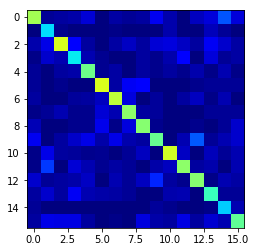

In [19]:
plt.imshow(conf, cmap='jet', vmin=0, vmax = 1)
plt.show()

Trisha confused with KatrinaKaif


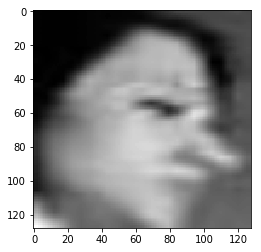

Trisha confused with Madhavan


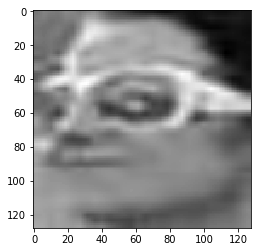

AnilKapoor confused with Madhavan


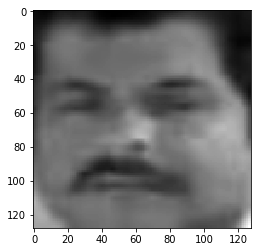

KatrinaKaif confused with Kajol


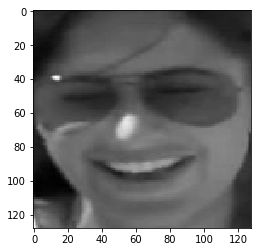

KajalAgarwal confused with Rimisen


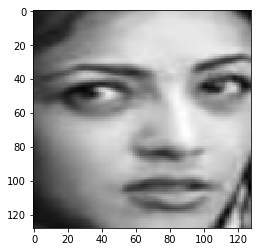

KatrinaKaif confused with Trisha


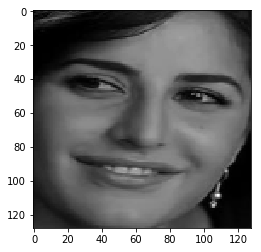

Trisha confused with AamairKhan


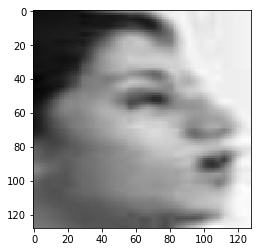

Rimisen confused with Trisha


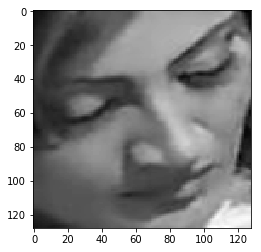

AnilKapoor confused with BomanIrani


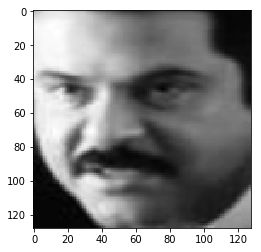

KareenaKapoor confused with Trisha


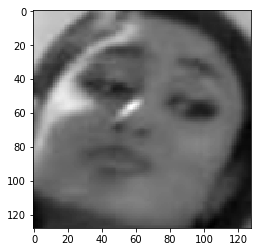

Kajol confused with Trisha


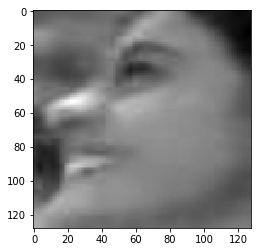

KatrinaKaif confused with KajalAgarwal


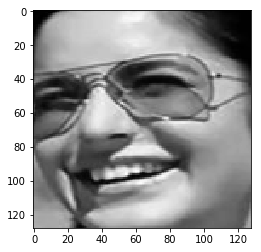

KareenaKapoor confused with MadhuriDixit


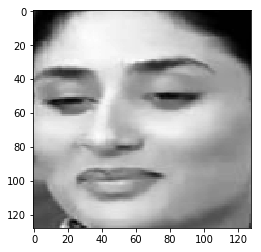

HrithikRoshan confused with Kajol


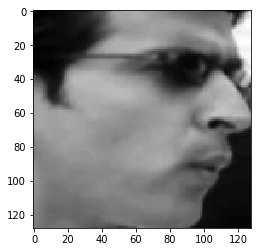

BomanIrani confused with RishiKapoor


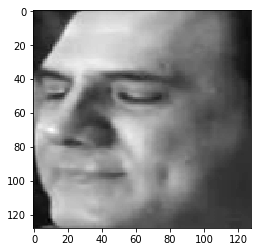

AamairKhan confused with HrithikRoshan


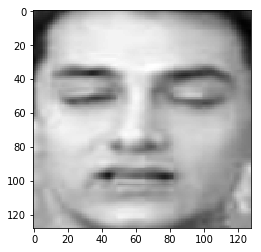

Umashri confused with AnilKapoor


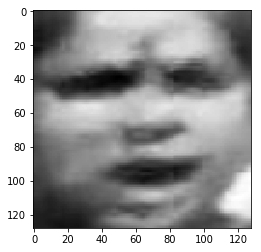

MadhuriDixit confused with KatrinaKaif


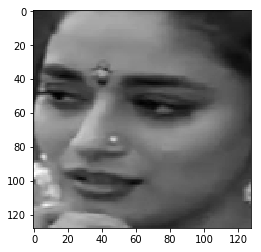

HrithikRoshan confused with Madhavan


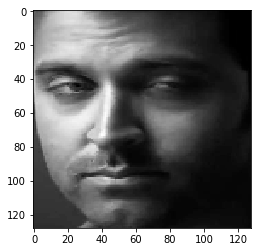

AnilKapoor confused with Kajol


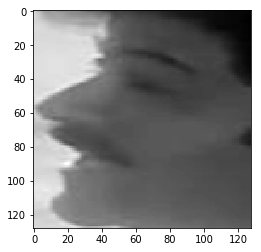

AamairKhan confused with Kajol


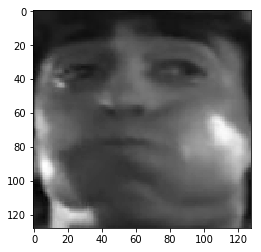

AmrishPuri confused with MadhuriDixit


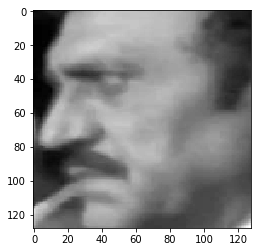

KatrinaKaif confused with KajalAgarwal


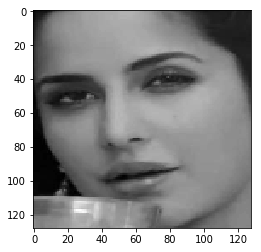

Madhavan confused with HrithikRoshan


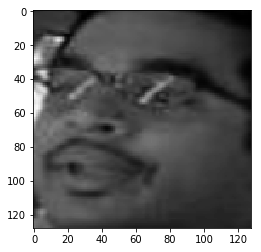

MadhuriDixit confused with AmrishPuri


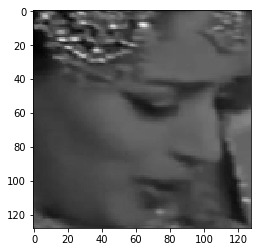

AamairKhan confused with HrithikRoshan


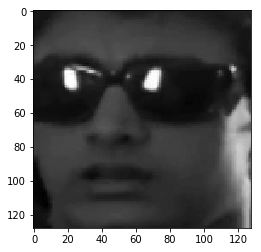

KareenaKapoor confused with AnilKapoor


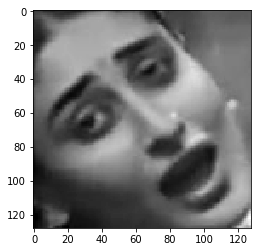

Madhavan confused with KatrinaKaif


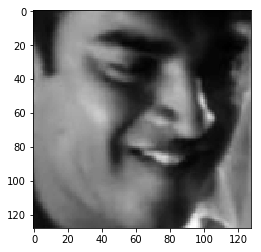

KareenaKapoor confused with KatrinaKaif


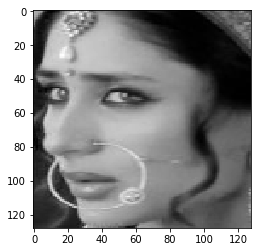

RishiKapoor confused with Trisha


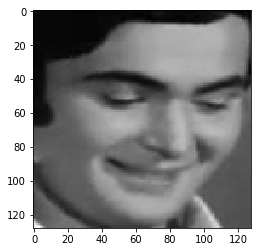

Trisha confused with BomanIrani


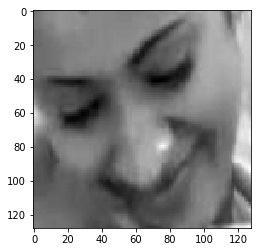

AnupamKher confused with AmrishPuri


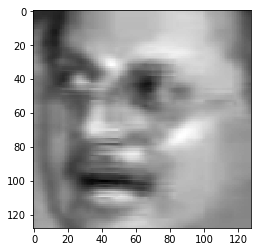

Madhavan confused with Trisha


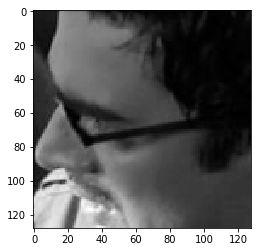

Trisha confused with Umashri


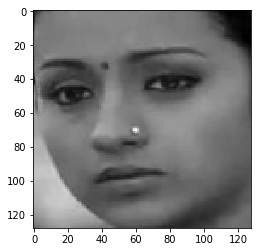

KareenaKapoor confused with Trisha


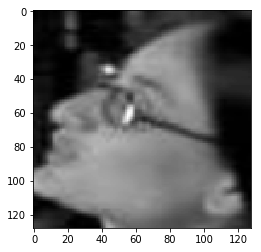

HrithikRoshan confused with KatrinaKaif


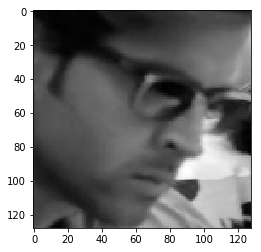

AmrishPuri confused with BomanIrani


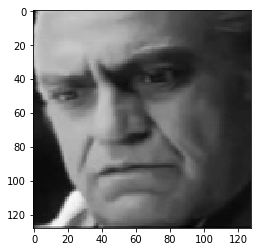

AmrishPuri confused with AnupamKher


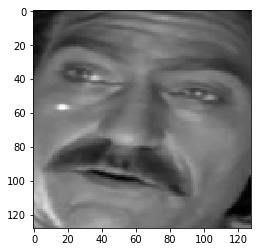

Trisha confused with AamairKhan


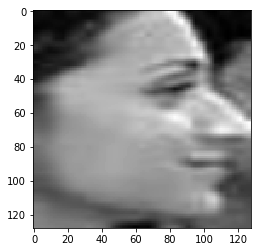

Madhavan confused with HrithikRoshan


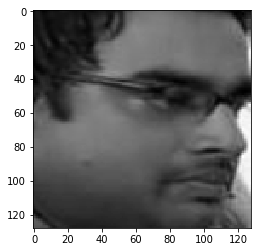

Kajol confused with Trisha


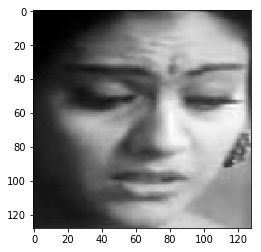

AnilKapoor confused with MadhuriDixit


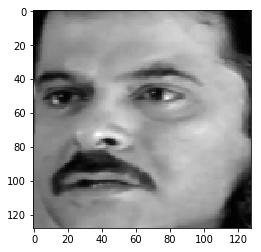

Rimisen confused with KatrinaKaif


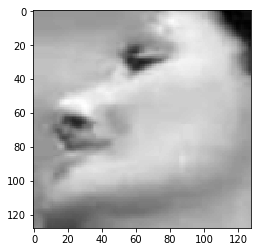

Rimisen confused with KatrinaKaif


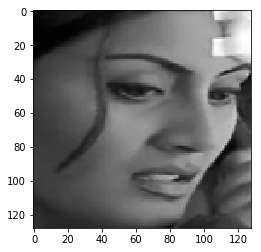

HrithikRoshan confused with Madhavan


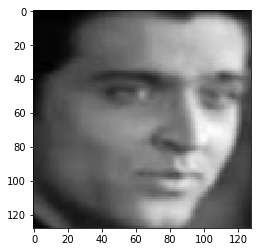

AnilKapoor confused with KatrinaKaif


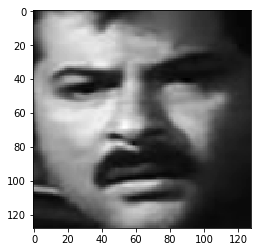

AnilKapoor confused with AamairKhan


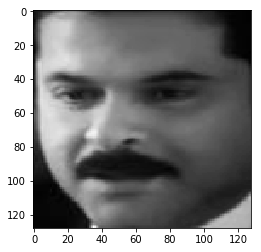

HrithikRoshan confused with AnupamKher


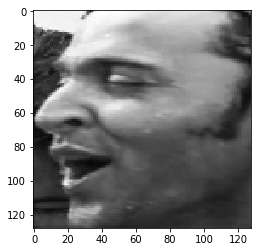

HrithikRoshan confused with AamairKhan


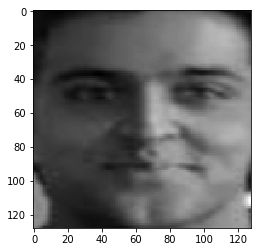

AamairKhan confused with HrithikRoshan


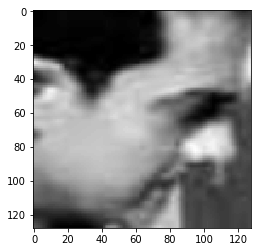

Kajol confused with KajalAgarwal


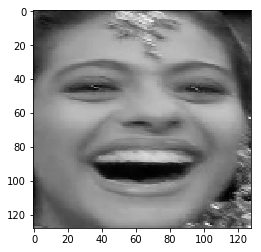

Madhavan confused with KatrinaKaif


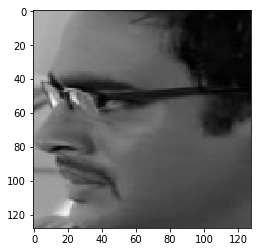

Kajol confused with Madhavan


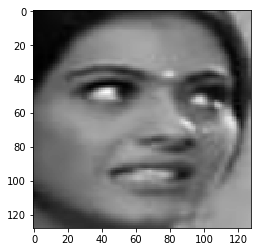

BomanIrani confused with Trisha


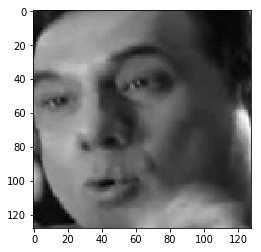

Rimisen confused with AnupamKher


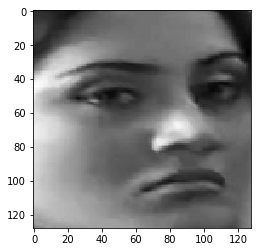

In [20]:
for w in wrong_predictions[::10]:
    print classes[w[2]], 'confused with', classes[w[1]]
    plt.imshow(w[0][0][0].data.cpu().numpy(), cmap='gray')
    plt.show()